In [6]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import re
import numpy as np
from bs4 import BeautifulSoup
from nltk.stem import WordNetLemmatizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation

In [7]:
# Read data from CSV file
df = pd.read_csv("reddit_opinion_PSE_ISR.csv")

In [8]:
df = pd.read_csv("reddit_opinion_PSE_ISR.csv", skiprows=[220009])


In [9]:
df.sample(5)

,comment_id,score,self_text,subreddit,created_time,post_id,author_name,controversiality,ups,downs,...,user_link_karma,user_comment_karma,user_total_karma,post_score,post_self_text,post_title,post_upvote_ratio,post_thumbs_ups,post_total_awards_received,post_created_time
119098,k94esoy,2,"Nothing except the ""return to 1967 borders"" wo...",IsraelPalestine,2023-11-13 21:17:51,17uib23,YehoEM_14,0,2,0,...,490.0,5216.0,5706.0,3,I was always under the impression that Jordan ...,What if Israel had returned the West Bank to J...,0.67,3,0,2023-11-13 19:16:39
34500,ka03w9h,11,"So what, now the plan is to go from hospital t...",Palestine,2023-11-20 10:48:29,17zhg0g,DumbNazis,0,11,0,...,6.0,18181.0,18187.0,151,NaN,After raiding and shutting down Al-Shifa and n...,0.95,151,0,2023-11-20 05:38:16
89467,k9ftr6s,61,Thank you for this.,CombatFootage,2023-11-16 01:08:27,17w5co9,joshmcx,0,61,0,...,2217.0,6276.0,9577.0,4448,NaN,Hamas Militant Killed By IDF at Entrance of Ba...,0.94,4448,0,2023-11-15 22:09:54
60381,k9qw9tj,1,So no video of Israeli's gloating? And no call...,IsraelPalestine,2023-11-18 09:07:59,17x1vv1,Bobiseternal,0,1,0,...,32.0,1398.0,1430.0,192,Where were all of these pro palestine people d...,Where were all of these so called white knight...,0.85,192,0,2023-11-17 00:16:24
53538,k9t7pxj,27,"I'd say just pretend you were sleeping, but co...",PublicFreakout,2023-11-18 21:25:36,17y599f,Sober-ButStillFucked,0,27,0,...,1.0,6199.0,6636.0,4170,NaN,This man was submitting a complaint against th...,0.96,4170,0,2023-11-18 12:16:11


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 232022 entries, 0 to 232021
Data columns (total 24 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   comment_id                  232022 non-null  object 
 1   score                       232022 non-null  int64  
 2   self_text                   232021 non-null  object 
 3   subreddit                   232022 non-null  object 
 4   created_time                232022 non-null  object 
 5   post_id                     232022 non-null  object 
 6   author_name                 232022 non-null  object 
 7   controversiality            232022 non-null  int64  
 8   ups                         232022 non-null  int64  
 9   downs                       232022 non-null  int64  
 10  user_is_verified            228209 non-null  object 
 11  user_account_created_time   228209 non-null  object 
 12  user_awardee_karma          232018 non-null  float64
 13  user_awarder_k

In [11]:
for i in range(10):
    print(df.self_text[i])

Actually my family has been in Israel for 600 years so be quite
Does anyone doubt that Iran WILL nuke Israel when their bomb is operational?  After all, it is their greatest aspiration on earth.  The grand prize is seventy-two virgins in blissful ecstasy.  Who could resist?

Clearly, the mullahs don't care about existentialism because their future is in the hands of Allah.  WW III sounds like fun to them because it will kill countless infidels.

World War III isn't likely to start with a single nuke.  If Israel nukes Iran, the other nuclear powers will have a "come to Jesus" meeting where they will have to decide whether Iran is their problem and whether they are willing to go down with them.   I highly suspect that, at the end of the day, none of Iran's friends are willing to follow them to hell.  Russia, China, India, and Pakistan all know that nothing will stop their total destruction should they choose to participate in Iran's insane initiatives.  Each of them will have to decide i

In [ ]:
import nltk
nltk.download()

In [ ]:
import zipfile
import os

#zip_file_path = "C:\Users\radha\Downloads\wordnet.zip"
zip_file_path = r"/Users/Amisha/Downloads/wordnet.zip"

destination_directory = '/Users/Amisha/nltk_data'

# Check if the specific file exists in the destination directory
file_to_check = 'index.adv'
file_path_to_check = os.path.join(destination_directory, 'wordnet', file_to_check)

if not os.path.exists(file_path_to_check):
    # Unzip the entire archive if the specific file doesn't exist
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(destination_directory)
    print(f"Successfully unzipped {zip_file_path} to {destination_directory}")
else:
    print(f"File {file_to_check} already exists. No need to unzip the archive.")

In [1]:
import nltk
nltk.download('stopwords')


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/Amisha/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [2]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /Users/Amisha/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [3]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /Users/Amisha/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [4]:
import nltk
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to /Users/Amisha/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [12]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from bs4 import BeautifulSoup
import re

# Initialize the lemmatizer and stopwords
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

def clean_text(text):
    # Check if the input is a valid string
    if isinstance(text, str):
        # Remove URLs
        text = re.sub(r'http\S+', '', text)

        # Remove HTML tags
        soup = BeautifulSoup(text, 'html.parser')
        text = soup.get_text()

        # Remove special characters and lowercase the text
        text = re.sub(r'[^a-zA-Z0-9\s]', '', text).lower()

        # Tokenization
        tokens = word_tokenize(text)

        # Lemmatization and removing stopwords
        tokens = [lemmatizer.lemmatize(token) for token in tokens if token not in stop_words]

        # Join the tokens back into a sentence
        cleaned_text = ' '.join(tokens)

        return cleaned_text
    else:
        # If the input is not a string, return an empty string or handle it according to your needs
        return ''

# Example usage on 'self_text' column of your DataFrame
df['clean_text'] = df['self_text'].apply(clean_text)


/tmp/ipykernel_13328/369728380.py:18: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  soup = BeautifulSoup(text, 'html.parser')


In [13]:
for i in range(10):
    print(df.clean_text[i])


actually family israel 600 year quite
anyone doubt iran nuke israel bomb operational greatest aspiration earth grand prize seventytwo virgin blissful ecstasy could resist clearly mullah dont care existentialism future hand allah ww iii sound like fun kill countless infidel world war iii isnt likely start single nuke israel nuke iran nuclear power come jesus meeting decide whether iran problem whether willing go highly suspect end day none iran friend willing follow hell russia china india pakistan know nothing stop total destruction choose participate iran insane initiative decide ww iii preferable nothing nope far easier complain meanwhile problem nuke supposed solve likely remediated recipient warfare definitely reconsider option worked japan work iran well give chance lot country misbehave get away repeatedly none country business human right dont weigh definition isnt universal human right arent thing culture human right nuclear power appreciate continued existence concept mutually

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 232022 entries, 0 to 232021
Data columns (total 25 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   comment_id                  232022 non-null  object 
 1   score                       232022 non-null  int64  
 2   self_text                   232021 non-null  object 
 3   subreddit                   232022 non-null  object 
 4   created_time                232022 non-null  object 
 5   post_id                     232022 non-null  object 
 6   author_name                 232022 non-null  object 
 7   controversiality            232022 non-null  int64  
 8   ups                         232022 non-null  int64  
 9   downs                       232022 non-null  int64  
 10  user_is_verified            228209 non-null  object 
 11  user_account_created_time   228209 non-null  object 
 12  user_awardee_karma          232018 non-null  float64
 13  user_awarder_k

# Sentiment Analysis using VADER

In [15]:
# Initialize the Sentiment Intensity Analyzer
analyzer = SentimentIntensityAnalyzer()

# Declare variables for scores
scores = {
    "Compound": [],
    "Positive": [],
    "Negative": [],
    "Neutral": []
}

# Generate sentiment scores for Reddit comments
for comment in df['clean_text']:
    compound = analyzer.polarity_scores(comment)["compound"]
    pos = analyzer.polarity_scores(comment)["pos"]
    neu = analyzer.polarity_scores(comment)["neu"]
    neg = analyzer.polarity_scores(comment)["neg"]

    scores["Compound"].append(compound)
    scores["Positive"].append(pos)
    scores["Negative"].append(neg)
    scores["Neutral"].append(neu)

# Create a new DataFrame for sentiment scores
sentiments_score = pd.DataFrame(scores)

# Join the sentiment scores DataFrame with the original DataFrame
df = pd.concat([df, sentiments_score], axis=1)

In [16]:
df.head()

,comment_id,score,self_text,subreddit,created_time,post_id,author_name,controversiality,ups,downs,...,post_title,post_upvote_ratio,post_thumbs_ups,post_total_awards_received,post_created_time,clean_text,Compound,Positive,Negative,Neutral
0,kadcby5,1,Actually my family has been in Israel for 600 ...,IsraelPalestine,2023-11-22 23:43:09,1815xgm,BridgeThink4214,0,1,0,...,"Why did my friend say “that’s funny, because P...",0.79,189,0,2023-11-22 10:15:09,actually family israel 600 year quite,0.0000,0.000,0.000,1.000
1,kadcasl,1,Does anyone doubt that Iran WILL nuke Israel w...,IsraelPalestine,2023-11-22 23:42:55,181kiqb,Device_whisperer,0,1,0,...,Does anyone doubt...,0.50,0,0,2023-11-22 21:39:48,anyone doubt iran nuke israel bomb operational...,0.0219,0.214,0.210,0.576
2,kadcas8,1,Cool. Please stop massacring civilians.,CombatFootage,2023-11-22 23:42:55,181md5j,bauN7,0,1,0,...,Inside Hamas' tunnels under Al Shifa Hospital ...,0.72,24,0,2023-11-22 22:57:52,cool please stop massacring civilian,0.3400,0.523,0.250,0.227
3,kadcanw,1,the only ethnic cleansing that has ever take p...,IsraelPalestine,2023-11-22 23:42:54,180tveu,Andromeda_Skye,0,1,0,...,Should Palestinians be angry with the Arab wor...,0.77,94,0,2023-11-21 22:46:06,ethnic cleansing ever take place israel israel...,-0.8957,0.081,0.100,0.819
4,kadca8g,1,I mean yeah it was fairly obvious Israel is ca...,AskMiddleEast,2023-11-22 23:42:48,181l92n,mkbilli,0,1,0,...,History of Israeli sexual assault against Pale...,1.00,11,0,2023-11-22 22:10:10,mean yeah fairly obvious israel carrying human...,-0.7579,0.071,0.282,0.647


In [17]:
# Define conditions for sentiment categories based on 'Compound' scores
# If Compound score is <= -0.5, classify as 'Negative'
# If Compound score is > -0.5 and < 0.5, classify as 'Neutral'
# If Compound score is >= 0.5, classify as 'Positive'
conditions = [
    (df['Compound'] <= -0.5),
    (df['Compound'] > -0.5) & (df['Compound'] < 0.5),
    (df['Compound'] > 0.5)
]

# Define corresponding values for each condition
values = ['Negative', 'Neutral', 'Positive']

# Create a new column 'Category' using np.select to assign values based on the conditions
df['Category'] = np.select(conditions, values)

In [18]:
df.head()

,comment_id,score,self_text,subreddit,created_time,post_id,author_name,controversiality,ups,downs,...,post_upvote_ratio,post_thumbs_ups,post_total_awards_received,post_created_time,clean_text,Compound,Positive,Negative,Neutral,Category
0,kadcby5,1,Actually my family has been in Israel for 600 ...,IsraelPalestine,2023-11-22 23:43:09,1815xgm,BridgeThink4214,0,1,0,...,0.79,189,0,2023-11-22 10:15:09,actually family israel 600 year quite,0.0000,0.000,0.000,1.000,Neutral
1,kadcasl,1,Does anyone doubt that Iran WILL nuke Israel w...,IsraelPalestine,2023-11-22 23:42:55,181kiqb,Device_whisperer,0,1,0,...,0.50,0,0,2023-11-22 21:39:48,anyone doubt iran nuke israel bomb operational...,0.0219,0.214,0.210,0.576,Neutral
2,kadcas8,1,Cool. Please stop massacring civilians.,CombatFootage,2023-11-22 23:42:55,181md5j,bauN7,0,1,0,...,0.72,24,0,2023-11-22 22:57:52,cool please stop massacring civilian,0.3400,0.523,0.250,0.227,Neutral
3,kadcanw,1,the only ethnic cleansing that has ever take p...,IsraelPalestine,2023-11-22 23:42:54,180tveu,Andromeda_Skye,0,1,0,...,0.77,94,0,2023-11-21 22:46:06,ethnic cleansing ever take place israel israel...,-0.8957,0.081,0.100,0.819,Negative
4,kadca8g,1,I mean yeah it was fairly obvious Israel is ca...,AskMiddleEast,2023-11-22 23:42:48,181l92n,mkbilli,0,1,0,...,1.00,11,0,2023-11-22 22:10:10,mean yeah fairly obvious israel carrying human...,-0.7579,0.071,0.282,0.647,Negative


# EDA

In [19]:
# Group the DataFrame by 'Category' and count the occurrences of each category
category_counts = df.groupby(['Category'])['Category'].count()

# Create a DataFrame with counts and rename the column to 'Counts'
counts_df = pd.DataFrame(category_counts).rename(columns={"Category": "Counts"})

# Calculate the percentage for each category and add it as a new column 'Percentage'
counts_df['Percentage'] = (counts_df['Counts'] / counts_df['Counts'].sum()) * 100

counts_df = counts_df.drop(index='0')

# Print or return the summary DataFrame
print(counts_df)

          Counts  Percentage
Category                    
Negative   65099   28.057253
Neutral   131409   56.636440
Positive   35506   15.302859


In [20]:
counts_df

,Counts,Percentage
Category,,
Negative,65099,28.057253
Neutral,131409,56.636440
Positive,35506,15.302859


In [21]:
import plotly.express as px

# Create a Pie Chart using Plotly
fig = px.pie(counts_df, values='Counts', names=counts_df.index,
             labels={'Category': 'Sentiment Category', 'Counts': 'Count'},
             title='Distribution of Sentiment Categories in Comments',
             hole=0.3,
             color_discrete_sequence=px.colors.qualitative.Set1)

# Set the background color of the Pie Chart to dark grey
fig.update_layout(paper_bgcolor='darkgrey')


# Show the Plotly Pie Chart
fig.show()

# Positive score comments

In [22]:
# Select the top 50 comments with the highest 'Compound' scores from the DataFrame
top_50_pos_comments = df.nlargest(n=50, columns=['Compound'])["clean_text"]

# This line selects the top 50 comments based on their 'Compound' scores,
# indicating the 50 comments with the most positive sentiment.


print(top_50_pos_comments)

# print top 5
# for com in top_50_pos_comments:
#     print(com, "\n"

159997    cool agree clear definition whats terrorist wh...
167630    lot dive since wont click link ill summarize y...
29283     united state benefit helping israel number way...
83362     freedom fighter dont rape freedom fighter dont...
145874    envisioned similar truly unique one kind one s...
55183     think key historical contemporary factor shape...
100728    im israeli jewish palestinian arab muslim ive ...
32707     please please please please please please plea...
130499    im israeli jewish muslim arab palestinian live...
61398     escalating violence death expansion colonialse...
100530    apartheid hasnt really experience israel sligh...
161447    arab state hadnt started war expulsion wouldnt...
139267    1 feel palestinian could differently achive pe...
40564     zionist jew able malice cunning convince world...
125385    religion ethnicity cant muslim christian jew e...
52234     grand mufti jerusalem meeting adolf hitler 194...
105024    freedom fighter murdered frien

# Negative score comments

In [23]:
# Select the top 50 comments with the highest 'Compound' scores from the DataFrame
top_50_neg_comments = df.nsmallest(n=50, columns=['Compound'])["clean_text"]

print(top_50_neg_comments)

## print top 5
# for com in top_50_neg_comments:
#     print(com, "\n")

29317     impression town people didnt fight back slaugh...
161672    yeah almost every palestinian death riot went ...
4592      1 regarding comment hamas stealing supply unrw...
177155    extremist hateful violent movement belief extr...
73378     israel bomb hamas target gaza recklessly endan...
112315    np dont understand hundereds thousand clearly ...
62385     read actual definition kneejerk defense indisc...
79752     first screw saudi arabia brutality citezens wa...
16461     hamas terrorist im arguing said israel peacefu...
42968     quite iraqi friend iraq u far common sentiment...
97300     id like address point 1 assume coming viewpoin...
33433     cant dont youre claiming sexual assault happen...
125326    man facing hate crime charge 3 pepper sprayed ...
126564    roni abuharon detective southern israeli city ...
195407    israel always go anyone wearing vest say press...
221562    esp idf see vest press written theyre instant ...
54055     obvious dont know anything isl

# Neutral score comments

In [24]:
# Select the top 50 comments with the highest 'Compound' scores from the DataFrame
top_50_neutral_comments = df.nsmallest(n=50, columns=['Compound'])["clean_text"]

print(top_50_neutral_comments)

## print top 5
# for com in top_50_neg_comments:
#     print(com, "\n")

29317     impression town people didnt fight back slaugh...
161672    yeah almost every palestinian death riot went ...
4592      1 regarding comment hamas stealing supply unrw...
177155    extremist hateful violent movement belief extr...
73378     israel bomb hamas target gaza recklessly endan...
112315    np dont understand hundereds thousand clearly ...
62385     read actual definition kneejerk defense indisc...
79752     first screw saudi arabia brutality citezens wa...
16461     hamas terrorist im arguing said israel peacefu...
42968     quite iraqi friend iraq u far common sentiment...
97300     id like address point 1 assume coming viewpoin...
33433     cant dont youre claiming sexual assault happen...
125326    man facing hate crime charge 3 pepper sprayed ...
126564    roni abuharon detective southern israeli city ...
195407    israel always go anyone wearing vest say press...
221562    esp idf see vest press written theyre instant ...
54055     obvious dont know anything isl

# comments with high upvotes

In [25]:
# Sort the DataFrame by 'score' in descending order and select unique 'clean_text' values
top_50_high_score_comments = df.sort_values('score', ascending=False)['clean_text'].drop_duplicates().head(50)

# This line sorts the DataFrame by 'score' in descending order,
# selects unique 'clean_text' values, and retrieves the top 50 comments
# with the highest scores.

print(top_50_high_score_comments)

# # print top 5
# for com in top_50_high_score_comments:
#     print(com, "\n")

214616    wouldnt emergency response time live even woul...
123957                        hamas want idf shoot hospital
93109                                   scheduling conflict
193482    mean least stand fucking conviction youve got ...
191472    thats create next generation fighter never forget
194357    wasnt sure saw passport said would sue every b...
214546    5 emergency worker standby two dude throw rock...
207633                              insult holocaust victim
162467    shot dying medic run take gun fuck back guy li...
218912               lucky sure spell stupid fuck funny way
218910          lucky alive hopefully helped remove head as
126447        new slogan proposal fuck hamas free palestine
221093                  recording prove school incompetence
218719    hey dad didnt let play barbies dress anything ...
123775    video regardless shooting location clear hamas...
41875     abbas also holocaust denier guess surprise eve...
108048       never let back country isra

# Comments with Low Upvotes

In [26]:
top_50_low_score_comments = df.sort_values('score', ascending=True)['clean_text'].drop_duplicates().head(50)
print(top_50_low_score_comments)

212390    making biblical reference killing innocent peo...
210792    spend 100000 intercept rocket cost le 3000 the...
36265     horrible take idf actually cared getting hosta...
12597     skinny thing picture really theyre calling bla...
212475      idiot say every target israel hit hamas fighter
106452                                                     
212397    russia bombing ukrainian hospital school bad i...
214729    like northern ireland steroid almost twice man...
41389     imagine thinking bbc problem isnt pro israel e...
105910    smart as like lmao youre touch world israel di...
43967     longer hospital civilian either fled killed id...
82648     israeli commit violence arrested palestinian c...
56090     around 500700 per year get randomly detained w...
59329     israeli also see intelligence forewarned attac...
223728       arm forcefully twisted behind back let see act
72659      precision bomb every block result carpet bombing
12225     agree israel also want credit 

# Visualization of the Sentiment Scores of Positive, Neutral & Negative Tweets

/tmp/ipykernel_13328/4104462291.py:10: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/Users/Amisha/anaconda3/lib/python3.11/site-packages/seaborn/distributions.py:2511: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


/tmp/ipykernel_13328/4104462291.py:10: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your c

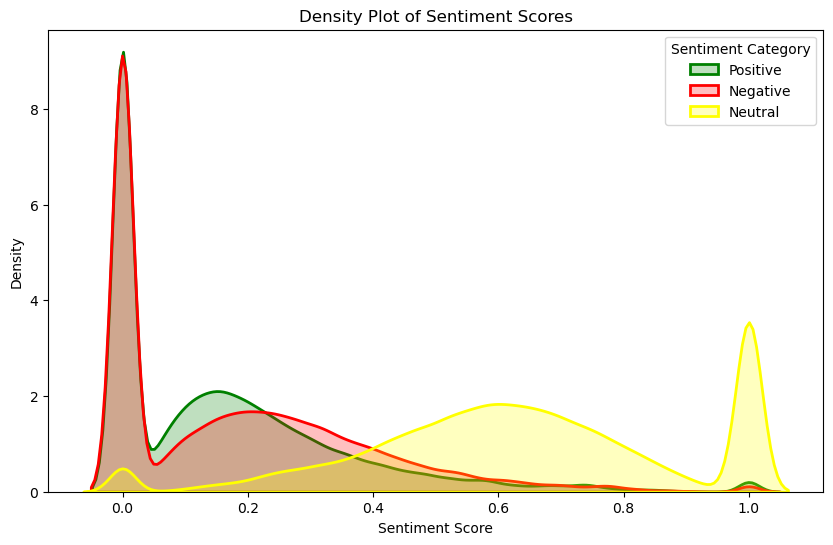

In [27]:
# Define the sentiment categories and corresponding colors
sentiment_categories = ["Positive", "Negative", "Neutral"]
colors = ['green', 'red', 'yellow']

# Set up the plot
plt.figure(figsize=(10, 6))

# Iterate over sentiment categories and plot KDE
for category, color in zip(sentiment_categories, colors):
    sns.distplot(df[category], hist=False, kde=True,
                 bins=int(180/5), color=color,
                 hist_kws={'edgecolor': 'black'},
                 kde_kws={'shade': True, 'linewidth': 2}, label=category)

# Set plot labels and legend
plt.xlabel('Sentiment Score')
plt.ylabel('Density')
plt.title('Density Plot of Sentiment Scores')
plt.legend(title='Sentiment Category')

# Show the plot
plt.show()

Visualization of the Sentiment Scores

/tmp/ipykernel_13328/1350581960.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/Users/Amisha/anaconda3/lib/python3.11/site-packages/seaborn/distributions.py:2511: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




<Axes: xlabel='Compound', ylabel='Density'>

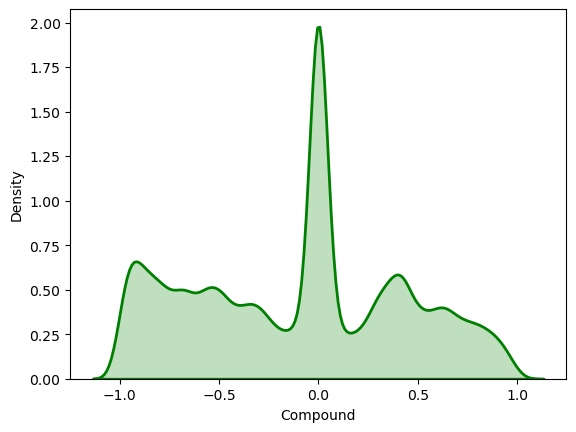

In [28]:
sns.distplot(df["Compound"], hist=False, kde=True,
             bins=int(180/5), color = 'green',
             hist_kws={'edgecolor':'black'},
             kde_kws={'shade': True,'linewidth': 2})

# WordCloud of All Sentiments

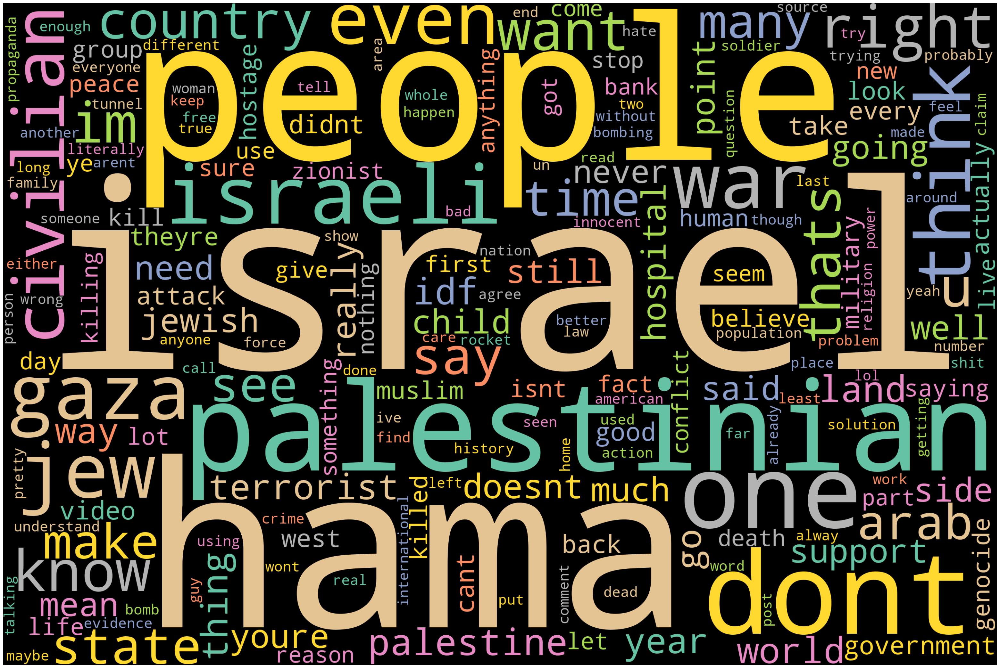

In [29]:
# Concatenate all comments into a single string
text = " ".join(comment for comment in df.clean_text)

# Create a WordCloud object
wordcloud = WordCloud(width=3000, height=2000, stopwords=STOPWORDS, background_color="black",
                      colormap='Set2', collocations=False).generate_from_text(text)

# Set figure size
plt.figure(figsize=(40, 30))

# Display the generated word cloud
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

# WordCloud of Positive Sentiments

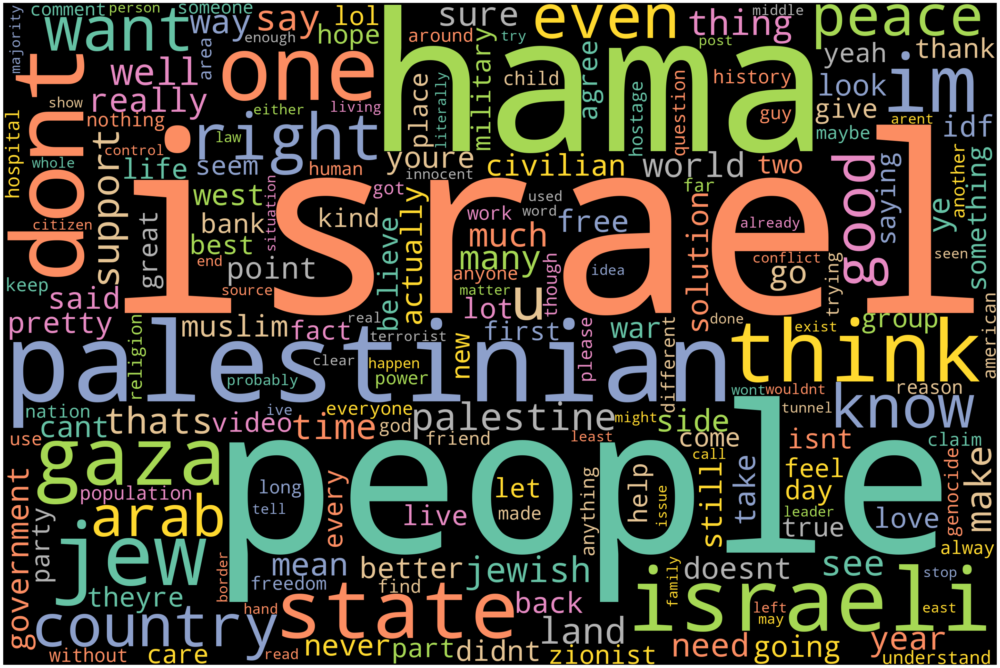

In [30]:
# Concatenate all comments into a single string
text = " ".join(comment for comment in df[df['Category']=='Positive'].clean_text)

# Create a WordCloud object
wordcloud = WordCloud(width=3000, height=2000, stopwords=STOPWORDS, background_color="black",
                      colormap='Set2', collocations=False).generate_from_text(text)

# Set figure size
plt.figure(figsize=(40, 30))

# Display the generated word cloud
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

# WordCloud of Neutral Sentiments

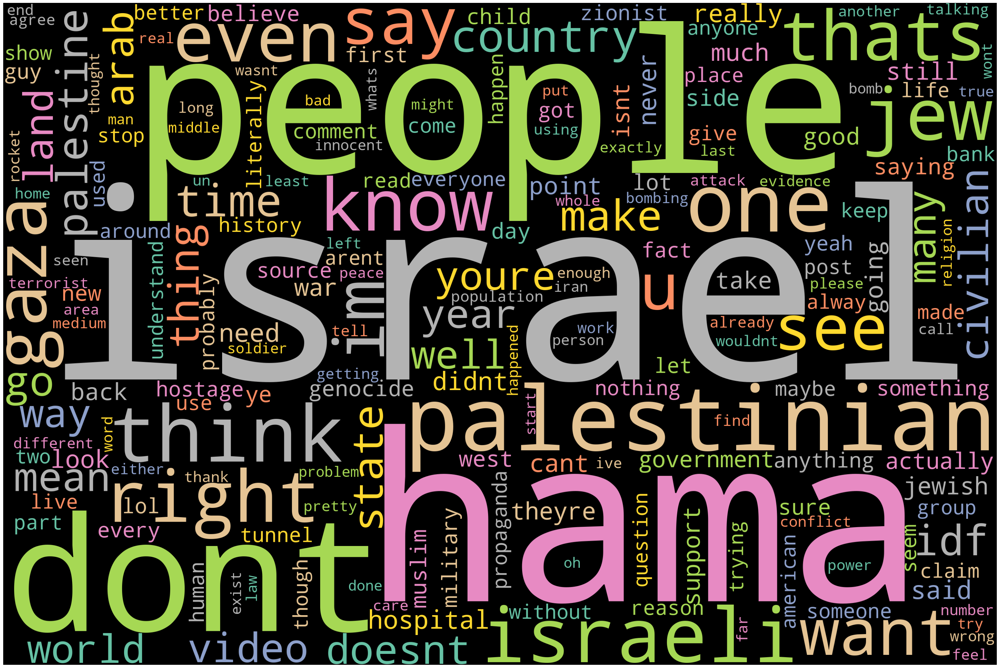

In [31]:
# Concatenate all comments into a single string
text = " ".join(comment for comment in df[df['Category']=='Neutral'].clean_text)

# Create a WordCloud object
wordcloud = WordCloud(width=3000, height=2000, stopwords=STOPWORDS, background_color="black",
                      colormap='Set2', collocations=False).generate_from_text(text)

# Set figure size
plt.figure(figsize=(40, 30))

# Display the generated word cloud
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

# WordCloud of Negative Sentiments

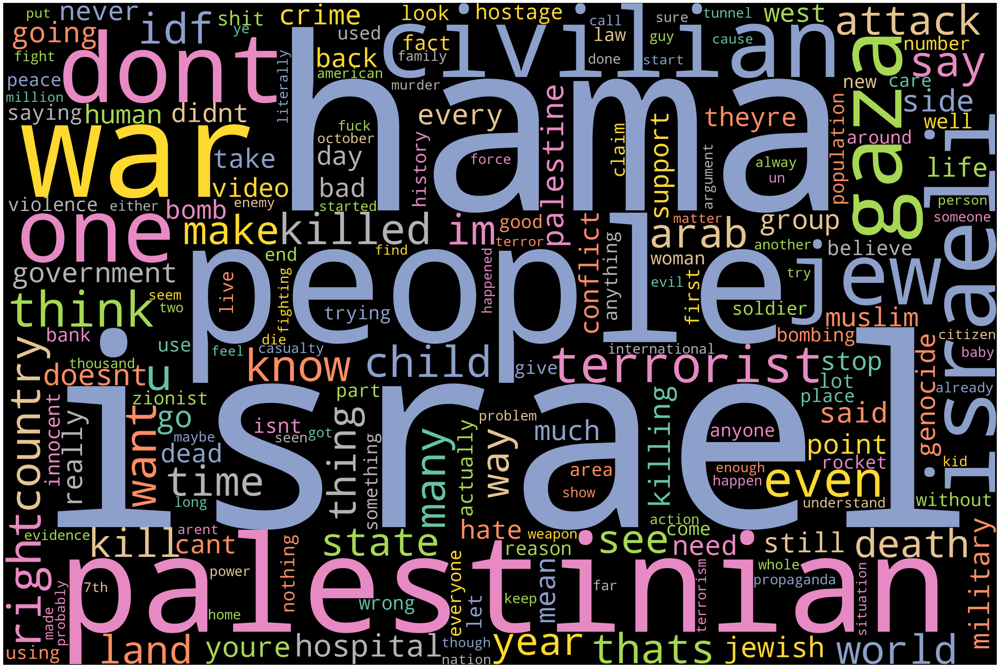

In [32]:
 #Concatenate all comments into a single string
text = " ".join(comment for comment in df[df['Category']=='Negative'].clean_text)

# Create a WordCloud object
wordcloud = WordCloud(width=3000, height=2000, stopwords=STOPWORDS, background_color="black",
                      colormap='Set2', collocations=False).generate_from_text(text)

# Set figure size
plt.figure(figsize=(40, 30))

# Display the generated word cloud
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 232022 entries, 0 to 232021
Data columns (total 30 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   comment_id                  232022 non-null  object 
 1   score                       232022 non-null  int64  
 2   self_text                   232021 non-null  object 
 3   subreddit                   232022 non-null  object 
 4   created_time                232022 non-null  object 
 5   post_id                     232022 non-null  object 
 6   author_name                 232022 non-null  object 
 7   controversiality            232022 non-null  int64  
 8   ups                         232022 non-null  int64  
 9   downs                       232022 non-null  int64  
 10  user_is_verified            228209 non-null  object 
 11  user_account_created_time   228209 non-null  object 
 12  user_awardee_karma          232018 non-null  float64
 13  user_awarder_k

In [34]:
df.head()

,comment_id,score,self_text,subreddit,created_time,post_id,author_name,controversiality,ups,downs,...,post_upvote_ratio,post_thumbs_ups,post_total_awards_received,post_created_time,clean_text,Compound,Positive,Negative,Neutral,Category
0,kadcby5,1,Actually my family has been in Israel for 600 ...,IsraelPalestine,2023-11-22 23:43:09,1815xgm,BridgeThink4214,0,1,0,...,0.79,189,0,2023-11-22 10:15:09,actually family israel 600 year quite,0.0000,0.000,0.000,1.000,Neutral
1,kadcasl,1,Does anyone doubt that Iran WILL nuke Israel w...,IsraelPalestine,2023-11-22 23:42:55,181kiqb,Device_whisperer,0,1,0,...,0.50,0,0,2023-11-22 21:39:48,anyone doubt iran nuke israel bomb operational...,0.0219,0.214,0.210,0.576,Neutral
2,kadcas8,1,Cool. Please stop massacring civilians.,CombatFootage,2023-11-22 23:42:55,181md5j,bauN7,0,1,0,...,0.72,24,0,2023-11-22 22:57:52,cool please stop massacring civilian,0.3400,0.523,0.250,0.227,Neutral
3,kadcanw,1,the only ethnic cleansing that has ever take p...,IsraelPalestine,2023-11-22 23:42:54,180tveu,Andromeda_Skye,0,1,0,...,0.77,94,0,2023-11-21 22:46:06,ethnic cleansing ever take place israel israel...,-0.8957,0.081,0.100,0.819,Negative
4,kadca8g,1,I mean yeah it was fairly obvious Israel is ca...,AskMiddleEast,2023-11-22 23:42:48,181l92n,mkbilli,0,1,0,...,1.00,11,0,2023-11-22 22:10:10,mean yeah fairly obvious israel carrying human...,-0.7579,0.071,0.282,0.647,Negative


# Positive or Negative Bias Detection

In [35]:
# Calculate the average sentiment scores for each subreddit
subreddit_sentiment = df.groupby('subreddit')[['Positive', 'Negative']].mean()

# Calculate the difference between positive and negative sentiment scores
subreddit_sentiment['Bias'] = subreddit_sentiment['Positive'] - subreddit_sentiment['Negative']

# Determine the direction of bias: Positive, Negative, or Neutral
def determine_bias_direction(bias):
    if bias > 0.01:  # You can adjust this threshold based on your dataset
        return 'Positive'
    elif bias < -0.01:  # You can adjust this threshold based on your dataset
        return 'Negative'
    else:
        return 'Neutral'

subreddit_sentiment['Bias Direction'] = subreddit_sentiment['Bias'].apply(determine_bias_direction)

# Sort subreddits based on bias in descending order
most_biased_subreddits = subreddit_sentiment.sort_values(by='Bias', ascending=False)

# Print or view the most biased subreddits with bias direction
print(most_biased_subreddits)

                       Positive  Negative      Bias Bias Direction
subreddit                                                         
AbruptChaos            0.202600  0.101036  0.101564       Positive
CrazyFuckingVideos     0.170974  0.145980  0.024993       Positive
NonCredibleDefense     0.161607  0.145683  0.015924       Positive
Palestine              0.173203  0.179962 -0.006759        Neutral
AskMiddleEast          0.161117  0.173026 -0.011909       Negative
ActualPublicFreakouts  0.170751  0.182955 -0.012204       Negative
CombatFootage          0.159752  0.174605 -0.014853       Negative
IsraelPalestine        0.166382  0.188002 -0.021620       Negative
worldnews              0.162558  0.184935 -0.022377       Negative
worldnewsvideo         0.166282  0.195892 -0.029610       Negative
PublicFreakout         0.163775  0.193726 -0.029951       Negative
TerrifyingAsFuck       0.163567  0.204881 -0.041314       Negative
IsrealPalestineWar_23  0.170803  0.217163 -0.046361       Nega

In [36]:
# Step 3: Topic Modeling
vectorizer = TfidfVectorizer(max_features=5000, stop_words='english')
tfidf_matrix = vectorizer.fit_transform(df['clean_text'])
lda_model = LatentDirichletAllocation(n_components=5, random_state=42, n_jobs=-1)  # Assuming 5 topics
lda_topic_matrix = lda_model.fit_transform(tfidf_matrix)

# Topic Modelling using LDA

In [37]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

# Load your dataset (replace 'your_dataset.csv' with your actual dataset file)
#df = pd.read_csv('your_dataset.csv')

# Use the relevant columns from your dataset
corpus = df['self_text'].astype(str).tolist()

# Create a TfidfVectorizer with English stop words

vectorizer = TfidfVectorizer(max_features=1000, stop_words='english')
X = vectorizer.fit_transform(corpus)
# Get feature names (words) from the vectorizer
feature_names = vectorizer.get_feature_names_out()

# Fit LDA model
n_topics = 5  # You can adjust the number of topics
lda_model = LatentDirichletAllocation(n_components=n_topics, random_state=42)
lda_model.fit(X)

# Get the top words for each topic
n_top_words = 10
top_words_per_topic = []
for topic_idx, topic in enumerate(lda_model.components_):
    top_words_idx = topic.argsort()[:-n_top_words - 1:-1]
    top_words = [feature_names[i] for i in top_words_idx]
    top_words_per_topic.append(top_words)

# Print the topics and associated words
for topic_idx, top_words in enumerate(top_words_per_topic):
    print(f"Topic #{topic_idx + 1}:")
    print(", ".join(top_words))
    print()


Topic #1:
https, com, www, amp, reddit, like, news, org, yes, palestine

Topic #2:
people, lol, just, don, like, good, think, fuck, right, shit

Topic #3:
israel, palestinians, jews, people, state, land, west, palestine, country, don

Topic #4:
just, idf, video, like, know, don, hamas, did, ve, thank

Topic #5:
hamas, israel, civilians, gaza, war, children, people, hostages, killed, idf



In [38]:
# Get the vocabulary indices for 'israel' and 'palestine' in your vectorizer
israel_word_index = vectorizer.vocabulary_['israel']
palestine_word_index = vectorizer.vocabulary_['palestine']
print(israel_word_index)
print(palestine_word_index)

469
648


The output of this code is the vocabulary indices assigned by the vectorizer to the words 'israel' and 'palestine'. These indices are numerical representations of the words within the vectorizer's vocabulary, which is crucial when working with machine learning models that require numerical input.

In [39]:
topic_term_distribution = lda_model.components_
print(topic_term_distribution)

[[4.21792955e-01 3.41633459e+02 2.22662400e+01 ... 2.58845241e-01
  4.87653184e+00 4.66734084e-01]
 [2.01527936e-01 2.82600195e+00 7.37687202e+01 ... 3.66126506e+02
  7.17767890e+02 4.98267021e+02]
 [1.27751055e+02 1.26472146e+02 2.28353153e+02 ... 1.98978371e+02
  2.55529760e+02 2.09689082e+02]
 [2.01110471e-01 4.08170390e+01 1.14196231e+02 ... 2.00284702e-01
  3.67190030e-01 2.07223627e-01]
 [5.67451505e+02 4.32802748e+02 2.46334500e+02 ... 2.00608802e-01
  1.26378310e+00 3.18671627e-01]]


The values in this matrix represent the weights of each term in contributing to each topic. Higher values indicate a stronger association between a term and a topic. Researchers or practitioners often analyze this matrix to understand the prevalent terms in each topic and their importance.

In [40]:
israel_topic_index = topic_term_distribution[:, israel_word_index].argmax()
palestine_topic_index = topic_term_distribution[:, palestine_word_index].argmax()
print(israel_topic_index)
print(palestine_topic_index)

2
2


The code is identifying the topics in an LDA model that are most strongly associated with the words 'israel' and 'palestine'. The resulting indices (israel_topic_index and palestine_topic_index) represent the topics where these words have the highest probability of occurrence according to the LDA model.

# Geopolitical Stance Determination Using Dominant Topics and Sentiment Scores

In [41]:
# Define the function to determine geopolitical stance
def determine_geopolitical_stance(row):
    sentiment_score = row['Compound']
    topic_distribution = lda_model.transform(vectorizer.transform([row['clean_text']]))[0]

    # Determine stance based on sentiment score and dominant topic
    if sentiment_score <= -0.5:
        return 'Against Israel/Palestine'
    elif sentiment_score >= 0.5 and topic_distribution.argmax() == israel_topic_index:
        return 'Supports Israel'
    elif sentiment_score >= 0.5 and topic_distribution.argmax() == palestine_topic_index:
        return 'Supports Palestine'
    else:
        return 'Neutral/Stance Not Clear'

# Apply the function to the DataFrame to determine geopolitical stances
df['geopolitical_stance'] = df.apply(determine_geopolitical_stance, axis=1)

In [42]:
stance_counts = df['geopolitical_stance'].value_counts()
print("Geopolitical Stance Distribution:")
print(stance_counts)

Geopolitical Stance Distribution:
geopolitical_stance
Neutral/Stance Not Clear    155112
Against Israel/Palestine     65099
Supports Israel              11811
Name: count, dtype: int64


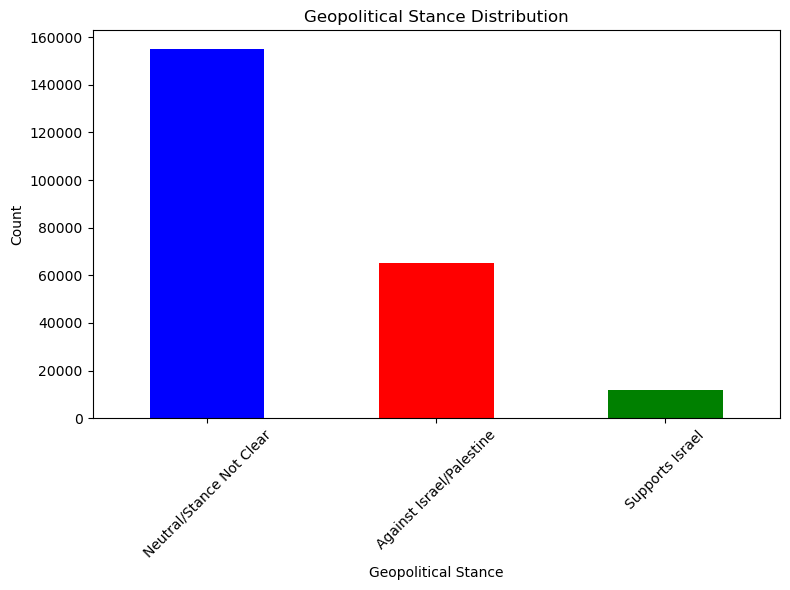

In [43]:
# Assuming 'geopolitical_stance' is a column in your DataFrame df
stance_counts = df['geopolitical_stance'].value_counts()

# Create bar chart using DataFrame values
plt.figure(figsize=(8, 6))
stance_counts.plot(kind='bar', color=['blue', 'red', 'green', 'yellow'])
plt.xlabel('Geopolitical Stance')
plt.ylabel('Count')
plt.title('Geopolitical Stance Distribution')
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.tight_layout()

# Show the chart
plt.show()